In [ ]:
# EDA 및 데이터 분석 순서

pandas profile
데이터 파악하기 - head, tail, count, type, shape, null, duplicate
데이터 처리 - 타입 변경, 중복, 결측 제거 및 대체 (상황을 가정), outlier 확인 (outlier를 모델링에 필요한 요소라 가정하고 제거 안함)

데이터 유형에 따른 확인 - 수치형, 순서형, 범주형 등
수치형 데이터 확인 - 통계 테이블 describe, plot, 정규성과 분포 histogram
수치형 데이터 처리 - 범위가 크고 치우친 데이터 정규화 (정규화는 모든 방법을 사용하여 효과를 비교하는 것이 좋으나 z표준화가 가장 효과적이라고 가정)
범주형 데이터 확인 - 변수의 항목 나열 및 카운트, 비율 확인, barplot

관계성 - group by mean, 정규성 가정 후 correlation, 유의미한 차이인지, 유의미한 관계성인지 검정, scatter plot, 평균비교(정규성 안따르면 비모수적 평균 비교 방법 사용) 

모델링 - 선형회귀, 로지스틱회귀, 변수선택법, 모델 결정, 해석, 잔차 분석(qq plot)  

+ 분야와 데이터에 따라 기존 실험을 바탕으로 분포나 데이터의 특성이 이미 충분히 탐색되었을 경우,
기존에 통상적으로 사용된 방법론도 함께 적용하여 비교하는 것이 좋음 



In [18]:
#설치된 library 확인
# !pip list

#library 설치 
!pip install missingno

  Using cached missingno-0.5.1-py3-none-any.whl (8.7 kB)


In [2]:
print(f'numpy version : {np.__version__}') # version check
print(f'matplotlib version : {mpl.__version__}') # version check

numpy version : 1.20.3
matplotlib version : 3.4.3


In [44]:
#Data Analysis & Data wrangling
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import missingno as mn
from collections import Counter

#Visualization
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.style as style
from matplotlib.colors import ListedColormap
from matplotlib import cm
import seaborn as sns
%matplotlib inline


#Plotly Libraris
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.colors import n_colors
from plotly.subplots import make_subplots
from plotly.offline import init_notebook_mode, iplot
from plotly import tools
from IPython.display import display, HTML

#Modeling
from sklearn.linear_model import LinearRegression


import statsmodels.api as sm
from wordcloud import WordCloud, ImageColorGenerator
from sklearn.preprocessing import StandardScaler

from scipy import stats
import scipy.stats as ss 
from scipy.stats import norm

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline


In [46]:
# Loading the database 
df = pd.read_csv("vgsales.csv")

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


In [73]:
df.head()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Action,Fomula,Sales_Category
0,1,Wii Sports,Wii,2006.0,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74,NO,50.15,Best
1,2,Super Mario Bros.,NES,1985.0,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,NO,72.27,Best
2,3,Mario Kart Wii,Wii,2008.0,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82,NO,44.25,Best
3,4,Wii Sports Resort,Wii,2009.0,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00,NO,47.73,Best
4,5,Pokemon Red/Pokemon Blue,GB,1996.0,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37,NO,35.93,Best


In [141]:
df.set_index("Rank", inplace=True)

In [72]:
df.describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Fomula
count,16598.000000,16327.000000,16598.000000,16598.000000,16598.000000,16598.000000,16598.000000,16598.000000
mean,8300.605254,2006.406443,0.264667,0.146652,0.077782,0.048063,0.537441,45.551916
std,4791.853933,5.828981,0.816683,0.505351,0.309291,0.188588,1.555028,34.082500
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000,0.000000
25%,4151.250000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000,0.000000
50%,8300.500000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000,50.000000
75%,12449.750000,2010.000000,0.240000,0.110000,0.040000,0.040000,0.470000,75.000000
max,16600.000000,2020.000000,41.490000,29.020000,10.220000,10.570000,82.740000,100.000000


In [71]:
# 새로운 변수 생성

# 범주형 변수 
df['Action'] = "NO"
df['Action'] = np.where(df['Genre'] == 'Action', 'YES', 'NO')

# 수식을 사용한 변수 생성
df['Fomula'] = (df['NA_Sales'] / df['Global_Sales'])*100
df['Fomula'] = np.round(df['Fomula'], 2)

# if elif else 변수 생성 
category = [] #리스트 생성
for row in df['Global_Sales'] :
    if row >= 1:
        category.append('Best') 
    elif row >= 0.47:
        category.append('Hight')
    elif row >= 0.17:
        category.append('Middle')
    else :
        category.append('Row')
        
df['Sales_Category'] = category # 새로운 열에 순차대로 원소를 대입

In [61]:
df.tail()

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Action,Fomula,Sales_Category
16593,16596,Woody Woodpecker in Crazy Castle 5,GBA,2002.0,Platform,Kemco,0.01,0.00,0.0,0.0,0.01,NO,100.0,Row
16594,16597,Men in Black II: Alien Escape,GC,2003.0,Shooter,Infogrames,0.01,0.00,0.0,0.0,0.01,NO,100.0,Row
16595,16598,SCORE International Baja 1000: The Official Game,PS2,2008.0,Racing,Activision,0.00,0.00,0.0,0.0,0.01,NO,0.0,Row
16596,16599,Know How 2,DS,2010.0,Puzzle,7G//AMES,0.00,0.01,0.0,0.0,0.01,NO,0.0,Row
16597,16600,Spirits & Spells,GBA,2003.0,Platform,Wanadoo,0.01,0.00,0.0,0.0,0.01,NO,100.0,Row


In [63]:
df['Genre'].value_counts( ).sort_values(ascending=False)

Action          3316
Sports          2346
Misc            1739
Role-Playing    1488
Shooter         1310
Adventure       1286
Racing          1249
Platform         886
Simulation       867
Fighting         848
Strategy         681
Puzzle           582
Name: Genre, dtype: int64

In [5]:
df.columns

Index(['Rank', 'Name', 'Platform', 'Year', 'Genre', 'Publisher', 'NA_Sales',
       'EU_Sales', 'JP_Sales', 'Other_Sales', 'Global_Sales'],
      dtype='object')

In [4]:
vgames_profile = ProfileReport(df, title='Video Games Profile Report')
vgames_profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
df.dtypes

Rank              int64
Name             object
Platform         object
Year            float64
Genre            object
Publisher        object
NA_Sales        float64
EU_Sales        float64
JP_Sales        float64
Other_Sales     float64
Global_Sales    float64
dtype: object

In [7]:
df.shape

(16598, 11)

In [8]:
df.count()

Rank            16598
Name            16598
Platform        16598
Year            16327
Genre           16598
Publisher       16540
NA_Sales        16598
EU_Sales        16598
JP_Sales        16598
Other_Sales     16598
Global_Sales    16598
dtype: int64

In [58]:
# 선택된 항목의 큰 순서대로 n개 출력 
df.nlargest(10, "JP_Sales")

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
4,5,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37
12,13,Pokemon Gold/Pokemon Silver,GB,1999,Role-Playing,Nintendo,9.00,6.18,7.20,0.71,23.10
1,2,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
6,7,New Super Mario Bros.,DS,2006,Platform,Nintendo,11.38,9.23,6.50,2.90,30.01
20,21,Pokemon Diamond/Pokemon Pearl,DS,2006,Role-Playing,Nintendo,6.42,4.52,6.04,1.37,18.36
26,27,Pokemon Black/Pokemon White,DS,2010,Role-Playing,Nintendo,5.57,3.28,5.65,0.82,15.32
25,26,Pokemon Ruby/Pokemon Sapphire,GBA,2002,Role-Playing,Nintendo,6.06,3.90,5.38,0.50,15.85
41,42,Animal Crossing: Wild World,DS,2005,Simulation,Nintendo,2.55,3.52,5.33,0.88,12.27
27,28,Brain Age 2: More Training in Minutes a Day,DS,2005,Puzzle,Nintendo,3.44,5.36,5.32,1.18,15.30
214,215,Monster Hunter Freedom 3,PSP,2010,Role-Playing,Capcom,0.00,0.00,4.87,0.00,4.87


In [10]:
df.count()

Rank            16598
Name            16598
Platform        16598
Year            16327
Genre           16598
Publisher       16540
NA_Sales        16598
EU_Sales        16598
JP_Sales        16598
Other_Sales     16598
Global_Sales    16598
dtype: int64

In [ ]:
# Outlier



In [ ]:
# 텍스트 분리 



In [11]:
# 결측치
print(df.isnull().sum())

Rank              0
Name              0
Platform          0
Year            271
Genre             0
Publisher        58
NA_Sales          0
EU_Sales          0
JP_Sales          0
Other_Sales       0
Global_Sales      0
dtype: int64


In [59]:
#check na TRUE
df.isna( )

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...
16593,False,False,False,False,False,False,False,False,False,False,False
16594,False,False,False,False,False,False,False,False,False,False,False
16595,False,False,False,False,False,False,False,False,False,False,False
16596,False,False,False,False,False,False,False,False,False,False,False


In [41]:
# 중복제거 
df = df.drop_duplicates()
df.head(5)

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
0,1,Wii Sports,Wii,2006,Sports,Nintendo,41.49,29.02,3.77,8.46,82.74
1,2,Super Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24
2,3,Mario Kart Wii,Wii,2008,Racing,Nintendo,15.85,12.88,3.79,3.31,35.82
3,4,Wii Sports Resort,Wii,2009,Sports,Nintendo,15.75,11.01,3.28,2.96,33.00
4,5,Pokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1.00,31.37


<AxesSubplot:>

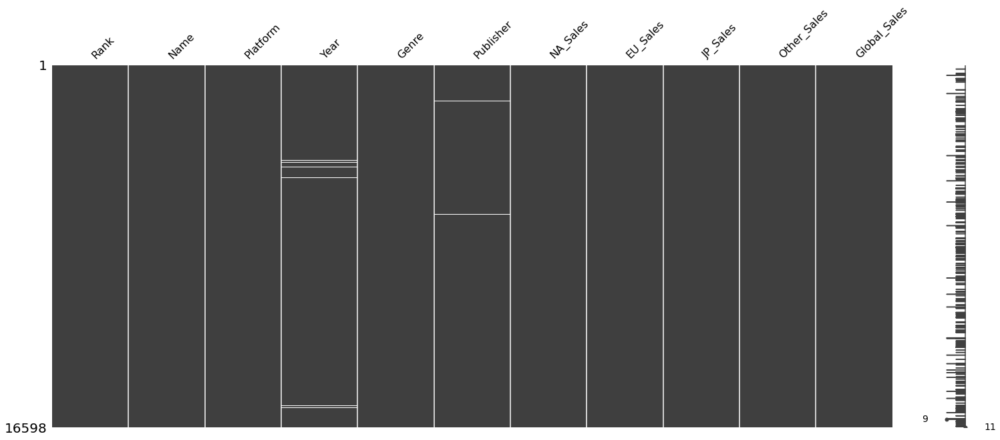

In [26]:
mn.matrix(df)

In [21]:
#Column wise null values in train data set 
null_vgd_perc = pd.DataFrame((df.isnull().sum())*100/df.shape[0]).reset_index()
null_vgd_perc.columns = ['Column Name', 'Null Values Percentage']
null_vgd_value = pd.DataFrame(df.isnull().sum()).reset_index()
null_vgd_value.columns = ['Column Name', 'Null Values']
null_vgd = pd.merge(null_vgd_value, null_vgd_perc, on='Column Name')
null_vgd

,Column Name,Null Values,Null Values Percentage
0,Rank,0,0.000000
1,Name,0,0.000000
2,Platform,0,0.000000
3,Year,271,1.632727
4,Genre,0,0.000000
5,Publisher,58,0.349440
6,NA_Sales,0,0.000000
7,EU_Sales,0,0.000000
8,JP_Sales,0,0.000000
9,Other_Sales,0,0.000000


In [32]:
df['Publisher'].isnull().sum()

58

In [31]:
# Publisher열에 NaN이 있는 행만 추출
df[df['Publisher'].isnull()]

,Rank,Name,Platform,Year,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
470,471,wwe Smackdown vs. Raw 2006,PS2,NaN,Fighting,NaN,1.57,1.02,0.00,0.41,3.00
1303,1305,Triple Play 99,PS,NaN,Sports,NaN,0.81,0.55,0.00,0.10,1.46
1662,1664,Shrek / Shrek 2 2-in-1 Gameboy Advance Video,GBA,2007.0,Misc,NaN,0.87,0.32,0.00,0.02,1.21
2222,2224,Bentley's Hackpack,GBA,2005.0,Misc,NaN,0.67,0.25,0.00,0.02,0.93
3159,3161,Nicktoons Collection: Game Boy Advance Video V...,GBA,2004.0,Misc,NaN,0.46,0.17,0.00,0.01,0.64
3166,3168,SpongeBob SquarePants: Game Boy Advance Video ...,GBA,2004.0,Misc,NaN,0.46,0.17,0.00,0.01,0.64
3766,3768,SpongeBob SquarePants: Game Boy Advance Video ...,GBA,2004.0,Misc,NaN,0.38,0.14,0.00,0.01,0.53
4145,4147,Sonic the Hedgehog,PS3,NaN,Platform,NaN,0.00,0.48,0.00,0.00,0.48
4526,4528,The Fairly Odd Parents: Game Boy Advance Video...,GBA,2004.0,Misc,NaN,0.31,0.11,0.00,0.01,0.43
4635,4637,The Fairly Odd Parents: Game Boy Advance Video...,GBA,2004.0,Misc,NaN,0.30,0.11,0.00,0.01,0.42


In [22]:
# 결측치 대체
df['Publisher'] = df['Publisher'].replace(np.nan, "Unknown")

# 결측치 대체 
df['Publisher'] = df['Publisher'].fillna("Unknown")

df['Publisher'].isnull().sum()

0

In [25]:
df['Year'].isnull().sum()

0

In [37]:
df['Year'].isnull().sum()

0

<AxesSubplot:>

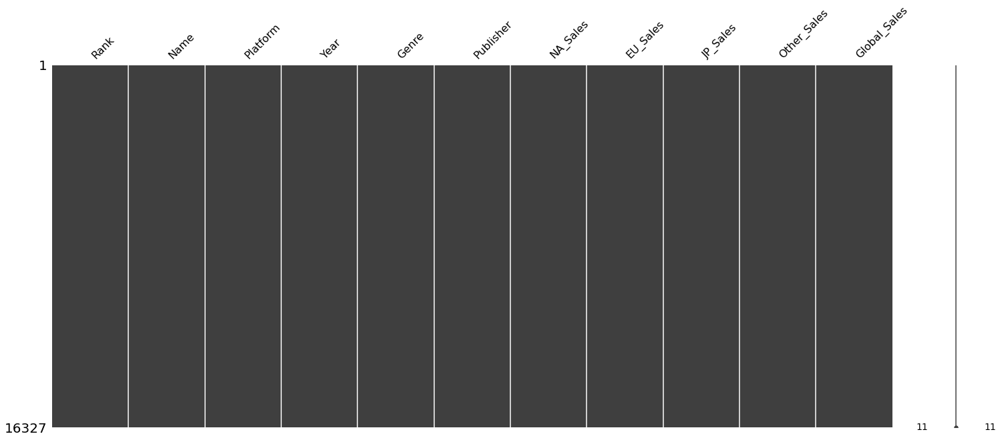

In [26]:
#보간법을 사용하지 않고 Year에 대해서는 제거를 하기로 가정한다 (1.6%)
df = df.dropna(inplace = True)    # Dropping the missing values.
df.count()

mn.matrix(df)

In [ ]:
# 보간법 - interpolate 함수의 선형방법 사용

df = df.interpolate(method='linear', limit_direction='forward') # forward 방향으로 값을 채움 



In [38]:
print(df.isnull().sum())   # After dropping the values

Rank            0
Name            0
Platform        0
Year            0
Genre           0
Publisher       0
NA_Sales        0
EU_Sales        0
JP_Sales        0
Other_Sales     0
Global_Sales    0
dtype: int64


In [142]:
# Year을 정수로 변환 - 결측치 제거 후 모든 값이 존재하는 상태에서 진행 가능 

df['Year']=df['Year'].astype('int')


IntCastingNaNError: Cannot convert non-finite values (NA or inf) to integer

In [ ]:
# 컬럼별 type 확인 및 결측치 확인
df.info()
df.isnull().sum()


In [28]:
df.dtypes

Rank              int64
Name             object
Platform         object
Year              int32
Genre            object
Publisher        object
NA_Sales        float64
EU_Sales        float64
JP_Sales        float64
Other_Sales     float64
Global_Sales    float64
dtype: object

In [15]:
# Numerical data summary 
df[["Rank", "Year", "NA_Sales", "EU_Sales", "JP_Sales", "Other_Sales", "Global_Sales"]].describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000
mean,8290.190228,2006.405561,0.265647,0.147731,0.078833,0.048426,0.540910
std,4792.654450,5.832412,0.822432,0.509303,0.311879,0.190083,1.567345
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,4132.500000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000
50%,8292.000000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000
75%,12439.500000,2010.000000,0.240000,0.110000,0.040000,0.040000,0.480000
max,16600.000000,2020.000000,41.490000,29.020000,10.220000,10.570000,82.740000


In [16]:
# Summary
# 자동으로 object는 빠짐
df.describe()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
count,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000,16291.000000
mean,8290.190228,2006.405561,0.265647,0.147731,0.078833,0.048426,0.540910
std,4792.654450,5.832412,0.822432,0.509303,0.311879,0.190083,1.567345
min,1.000000,1980.000000,0.000000,0.000000,0.000000,0.000000,0.010000
25%,4132.500000,2003.000000,0.000000,0.000000,0.000000,0.000000,0.060000
50%,8292.000000,2007.000000,0.080000,0.020000,0.000000,0.010000,0.170000
75%,12439.500000,2010.000000,0.240000,0.110000,0.040000,0.040000,0.480000
max,16600.000000,2020.000000,41.490000,29.020000,10.220000,10.570000,82.740000


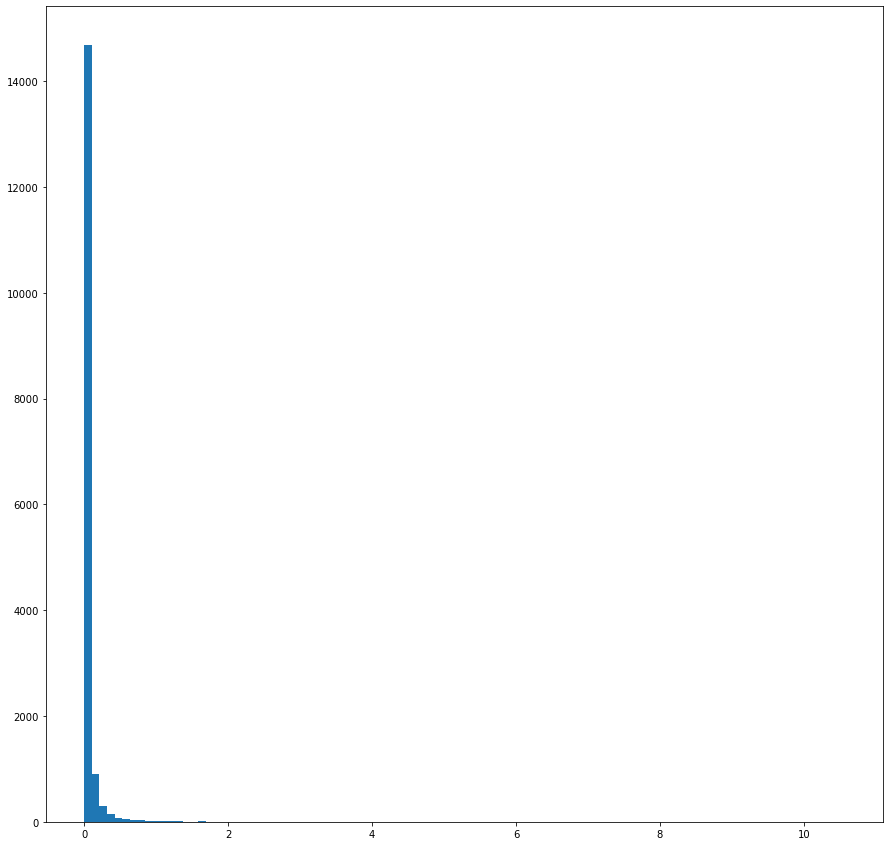

In [78]:
#histogram
plt.hist(df["Other_Sales"], bins = 100)
plt.show()

In [30]:
# 범위가 크거나 치우쳐서 정규성이 위반되는 경우 변환 시도 

# 데이터 확인 - 0이 있거나 0보다 작으면 모든 값에 1을 더해주기 
df['Other_Sales'].describe()


count    16327.000000
mean         0.048325
std          0.189885
min          0.000000
25%          0.000000
50%          0.010000
75%          0.040000
max         10.570000
Name: Other_Sales, dtype: float64

In [31]:
df_other = df['Other_Sales'] +1
df_other.describe()


count    16327.000000
mean         1.048325
std          0.189885
min          1.000000
25%          1.000000
50%          1.010000
75%          1.040000
max         11.570000
Name: Other_Sales, dtype: float64

7.25980566820295


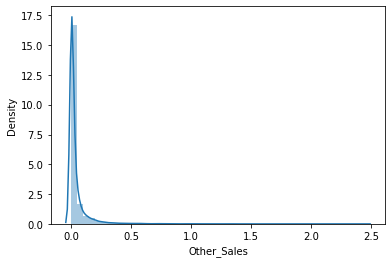

In [32]:
# 로그 변환
df_log = np.log(df['Other_Sales'] +1)
# skewness 확인
print(df_log.skew())
# KDE plot 출력
sns.distplot(df_log);

3.290308667440536


C:\Users\YUJIN\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Other_Sales', ylabel='Density'>

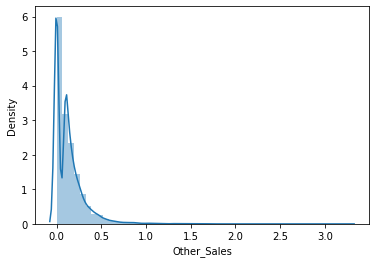

In [35]:
# 루트 변환
df_root = np.sqrt(df['Other_Sales'])
# skewness 확인
print(df_root.skew())
# KDE plot 출력
sns.distplot(df_root)

In [84]:
# z score
data_ss=ss.zscore(df["Other_Sales"])
# skewness 확인
print(data_ss.skew())
# KDE plot 출력
sns.distplot(data_ss)

NameError: name 'zscore' is not defined

7.25980566820295


C:\Users\YUJIN\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



<AxesSubplot:xlabel='Other_Sales', ylabel='Density'>

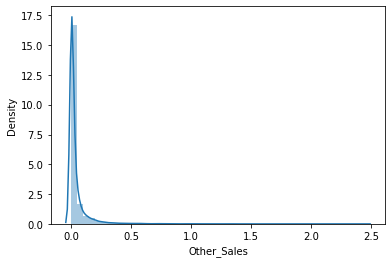

In [39]:
data_ss=np.log1p(df["Other_Sales"])
# skewness 확인
print(data_ss.skew())
# KDE plot 출력
sns.distplot(data_ss)

0.9663337685516924


C:\Users\YUJIN\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning:

`distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).



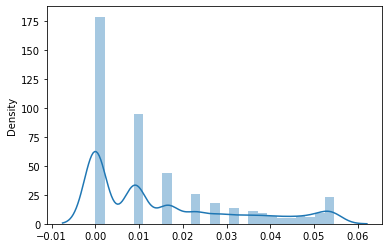

In [43]:
# box-cox 변환
df_boxcox = pd.Series(stats.boxcox(df["Other_Sales"]+1)[0])
# skewness 확인
print(df_boxcox.skew())
# KDE plot 출력
sns.distplot(df_boxcox);

In [93]:
data_ss.describe()

count    16327.000000
mean         0.040181
std          0.101714
min          0.000000
25%          0.000000
50%          0.009950
75%          0.039221
max          2.448416
Name: Other_Sales, dtype: float64

Before Skewness: 24.126
Before Kurtosis: 1014.006
After Skewness: 7.260
After Kurtosis: 87.045


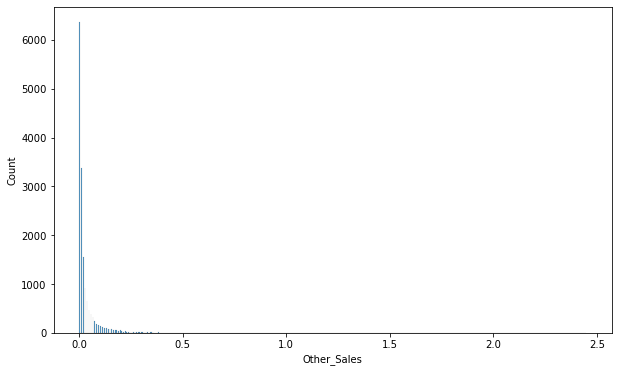

In [98]:
f, ax = plt.subplots(figsize = (10, 6))

sns.histplot(data_ss)

print("Before Skewness: {:.3f}".format(df["Other_Sales"].skew()))
print("Before Kurtosis: {:.3f}".format(df["Other_Sales"].kurt()))

print("After Skewness: {:.3f}".format(data_ss.skew()))
print("After Kurtosis: {:.3f}".format(data_ss.kurt()))

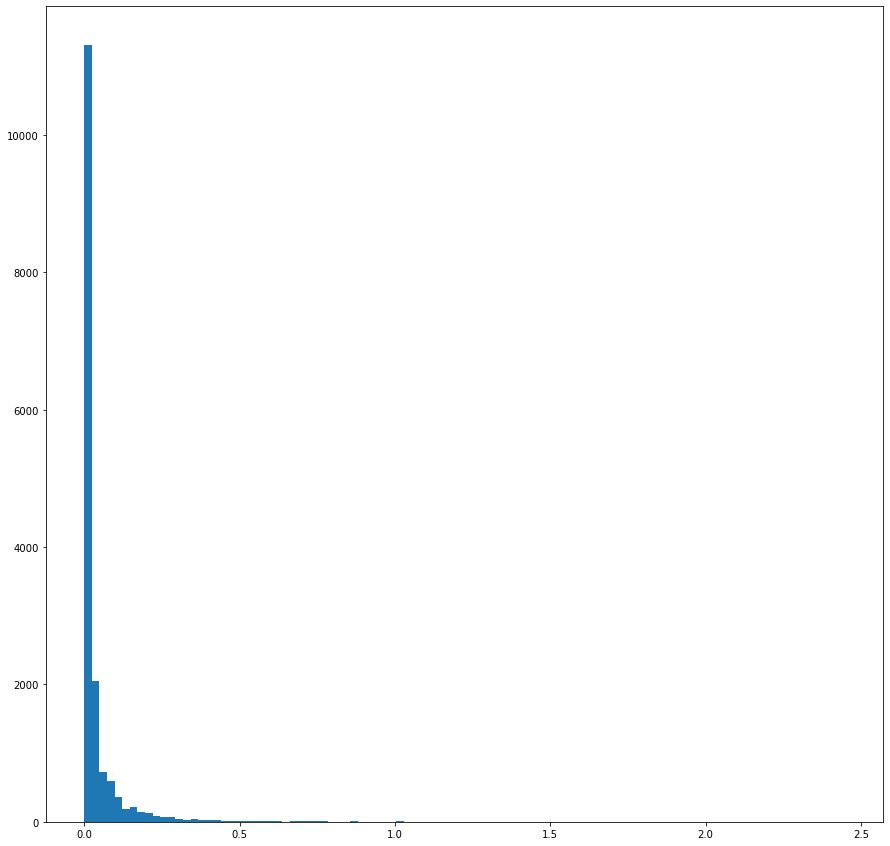

In [94]:
plt.hist(data_ss, bins = 100)
plt.show()

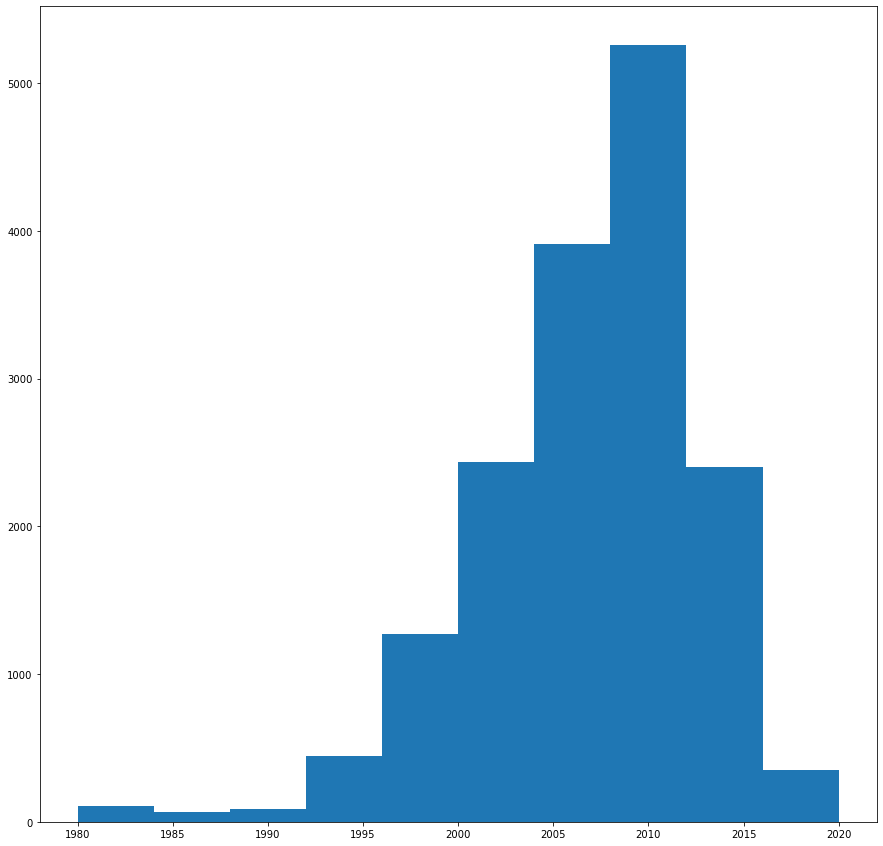

In [74]:
#histogram
plt.hist(df["Year"])
plt.show()

In [67]:
# correlation
df.corr( )

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
Rank,1.000000,0.178814,-0.400328,-0.379024,-0.269138,-0.332521,-0.426880
Year,0.178814,1.000000,-0.091402,0.006014,-0.169316,0.041058,-0.074735
NA_Sales,-0.400328,-0.091402,1.000000,0.768936,0.451285,0.634508,0.941268
EU_Sales,-0.379024,0.006014,0.768936,1.000000,0.436414,0.726266,0.903271
JP_Sales,-0.269138,-0.169316,0.451285,0.436414,1.000000,0.290653,0.612794
Other_Sales,-0.332521,0.041058,0.634508,0.726266,0.290653,1.000000,0.747974
Global_Sales,-0.426880,-0.074735,0.941268,0.903271,0.612794,0.747974,1.000000


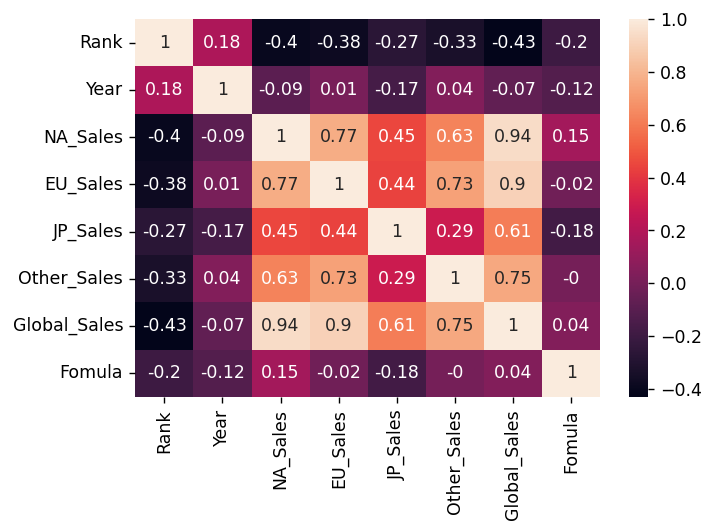

In [74]:
# Heatmap 
plt.figure(dpi=125)
sns.heatmap(np.round(df.corr(),2), annot=True)
plt.show()

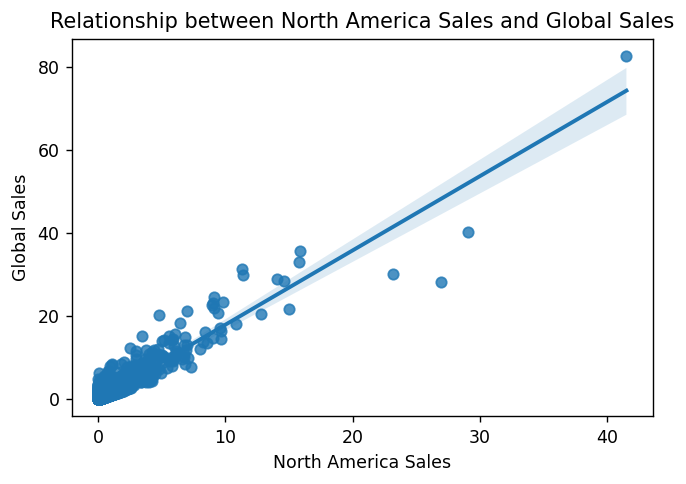

In [76]:
# Scatter Plot
plt.figure(dpi=125)
sns.regplot(x=df['NA_Sales'],y=df['Global_Sales'])
plt.xlabel('North America Sales')
plt.ylabel('Global Sales')
plt.title('Relationship between North America Sales and Global Sales')
plt.show()

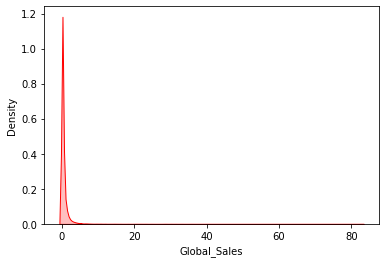

In [79]:
# 정규성 검정

# plot 확인 
sns.kdeplot(data=df['Global_Sales'], color="red", shade=True)
plt.show()

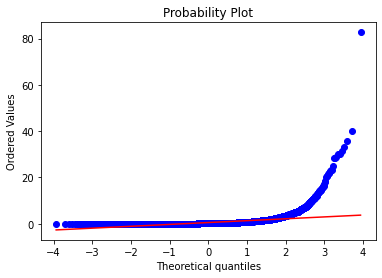

In [96]:
# QQ plot

plt.figure()
probplot(df["Global_Sales"], plot=plt)
plt.show()


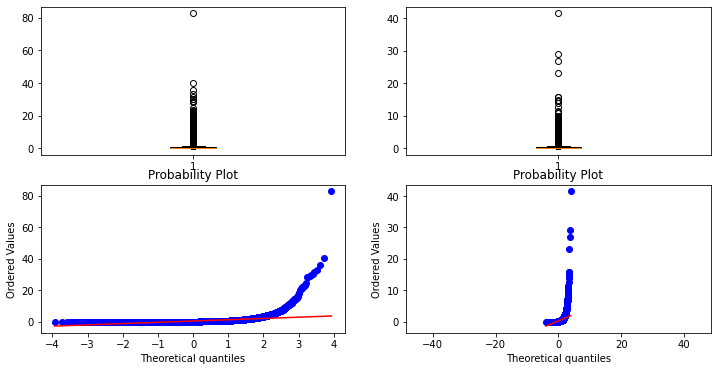

In [97]:

# 시각화
f, axes = plt.subplots(2, 2, figsize=(12, 6))
axes[0][0].boxplot(df["Global_Sales"])
probplot(df["Global_Sales"], plot=axes[1][0])
axes[0][1].boxplot(df["NA_Sales"])
probplot(df["NA_Sales"], plot=axes[1][1])
plt.axis("equal")
plt.show()


In [87]:
# 정규성 검정

# Shapiro - Test

shapiro_test = stats.shapiro(df["Global_Sales"])
shapiro_test

# P값이 0.05(일반적인 귀무가설 검정 임계치 수준)보다 작음
# 해당 데이터는 정규성을 충족한다는 귀무가설을 기각
# 즉, 정규성을 따르지 않는다 

ShapiroResult(statistic=0.2726662755012512, pvalue=0.0)

In [90]:
# KS-Test

ks_test = stats.kstest(df["Global_Sales"] , 'norm')
ks_test

# P값이 0.05(일반적인 귀무가설 검정 임계치 수준)보다 작음
# 해당 데이터는 정규성을 충족한다는 귀무가설을 기각
# 즉, 정규성을 따르지 않는다 

KstestResult(statistic=0.5039893563146316, pvalue=0.0)

In [91]:
# Normal-Test

nn_test = stats.normaltest(df["Global_Sales"])
nn_test

# P값이 0.05(일반적인 귀무가설 검정 임계치 수준)보다 작음
# 해당 데이터는 정규성을 충족한다는 귀무가설을 기각
# 즉, 정규성을 따르지 않는다 

NormaltestResult(statistic=34435.72520793447, pvalue=0.0)

In [93]:
# 등분산성 
# 귀무가설 H0: 데이터셋의 분산이 같다.

# 정규성 가정 후 Bartlett’s test
bartlett(df["Global_Sales"], df["JP_Sales"])

# P값이 0.05보다 작으므로 귀무가설 기각, 분산이 같지 않다 

BartlettResult(statistic=31885.78637485661, pvalue=0.0)

In [94]:
# 정규성 아닐때 Levene’s test
levene(df["Global_Sales"], df["JP_Sales"])

# P값이 0.05보다 작으므로 귀무가설 기각, 분산이 같지 않다 
# 집단간 동질성이 같지 않다 

LeveneResult(statistic=1034.9165070159581, pvalue=1.269395903982492e-223)

In [95]:
# 독립성 검정 

# chiresult = chisquare()
# chiresult

ValueError: For each axis slice, the sum of the observed frequencies must agree with the sum of the expected frequencies to a relative tolerance of 1e-08, but the percent differences are:
5.909606357763628

In [ ]:
# 로지스틱회귀(Logistic Regression)
from scipy.stats import shapiro, probplot
from scipy.stats import kstest

from scipy.stats import normaltest
from scipy.stats import bartlett, levene

from scipy.stats import chi2_contingency, chisquare

from sklearn.linear_model import LogisticRegression




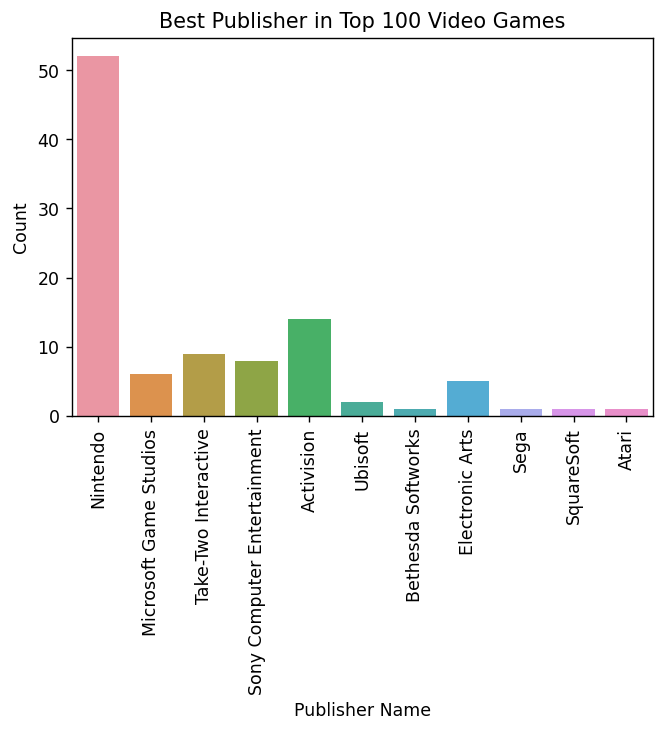

In [80]:
# Count Plot
plt.figure(dpi=125)
sns.countplot(df.head(100)['Publisher'])
plt.xlabel('Publisher Name')
plt.xticks(rotation=90)
plt.ylabel('Count')
plt.title('Best Publisher in Top 100 Video Games')
plt.show()

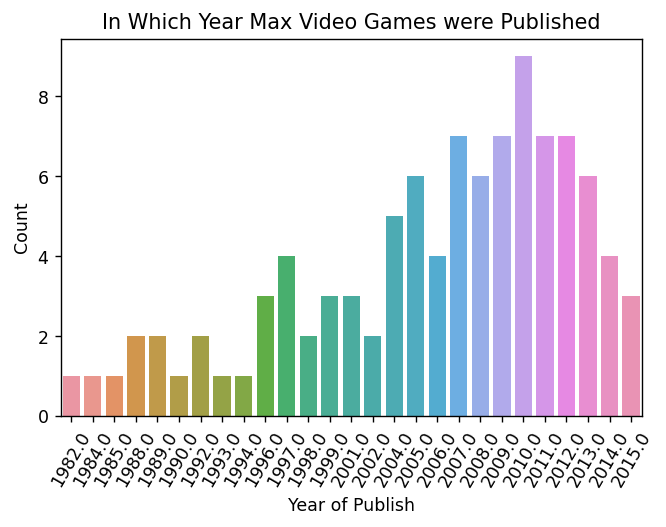

In [103]:
# Year of Max Video Games Published
plt.figure(dpi=125)
sns.countplot(df.head(100)['Year'])
plt.xlabel('Year of Publish')
plt.xticks(rotation=60)
plt.ylabel('Count')
plt.title('In Which Year Max Video Games were Published')
plt.show()

In [106]:
tdf = df.copy()
# tdf['Year'] = df['Year'].fillna(df['Year'].mean())
tdf = df[df['Year'].notna()] # Carefull about this
tdf = tdf.sort_values('Year', ascending=True)

top_tdf = tdf.groupby(['Platform', 'Year']).agg({"Global_Sales": 'count'}).reset_index()
top_tdf.columns = ['Platform', 'Year', 'Count']
top_tdf = top_tdf[top_tdf['Year'].isin([2014, 2015])]
top_tdf = top_tdf[top_tdf['Count'] > top_tdf['Count'].sum() * 0.01]
top_tdf['Year'] = top_tdf['Year'].astype(str)

fig = px.bar(
    top_tdf,
    x='Platform',
    y='Count',
    color='Year',
    barmode="group"
)
fig.update_layout(title="Total released video-games by platform")
fig.update_xaxes(type='category')
fig.update_xaxes(categoryorder='category ascending')
fig.show()

No handles with labels found to put in legend.


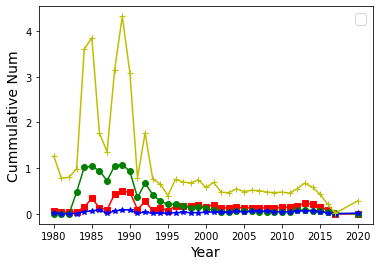

In [140]:

dfByGenre = df.groupby("Year").mean()
dfByGenre

# Line Graph by matplotlib with wide-form DataFrame

plt.plot(dfByGenre.index, dfByGenre.EU_Sales, marker='s', color='r')
plt.plot(dfByGenre.index, dfByGenre.JP_Sales, marker='o', color='g')
plt.plot(dfByGenre.index, dfByGenre.Other_Sales, marker='*', color='b')
plt.plot(dfByGenre.index, dfByGenre.Global_Sales, marker='+', color='y')

plt.ylabel('Cummulative Num', fontsize=14)
plt.xlabel('Year', fontsize=14)
plt.legend(fontsize=14)


plt.show()



In [117]:

plt.plot(df['Year'],df['Global_Sales'].groupby("Genre").mean())

KeyError: 'Genre'

In [17]:
df.groupby("Genre").mean()

,Rank,Year,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales
Genre,,,,,,,
Action,7983.940941,2007.906183,0.265078,0.158868,0.048800,0.056881,0.529942
Adventure,11541.850863,2008.127943,0.080008,0.050031,0.040808,0.013108,0.184137
Fighting,7621.746411,2004.630383,0.264043,0.119617,0.104246,0.043289,0.531160
Misc,8567.699288,2007.300119,0.235421,0.125605,0.063268,0.043843,0.468488
Platform,6879.930286,2003.811429,0.509703,0.229314,0.149314,0.058869,0.947577
Puzzle,9643.482456,2005.228070,0.214053,0.088632,0.099439,0.021877,0.424930
Racing,7917.818776,2004.835102,0.291371,0.192906,0.046212,0.062596,0.593273
Role-Playing,8054.593197,2007.051020,0.222109,0.127599,0.238293,0.040395,0.628456
Shooter,7331.832293,2005.918877,0.448643,0.242161,0.029782,0.079485,0.800468


In [18]:
df.groupby("Genre")[["Global_Sales"]].mean()

,Global_Sales
Genre,
Action,0.529942
Adventure,0.184137
Fighting,0.531160
Misc,0.468488
Platform,0.947577
Puzzle,0.424930
Racing,0.593273
Role-Playing,0.628456
Shooter,0.800468


In [19]:
df["Genre"].value_counts()

Action          3251
Sports          2304
Misc            1686
Role-Playing    1470
Shooter         1282
Adventure       1274
Racing          1225
Platform         875
Simulation       848
Fighting         836
Strategy         670
Puzzle           570
Name: Genre, dtype: int64

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 16291 entries, 0 to 16597
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Rank          16291 non-null  int64  
 1   Name          16291 non-null  object 
 2   Platform      16291 non-null  object 
 3   Year          16291 non-null  float64
 4   Genre         16291 non-null  object 
 5   Publisher     16291 non-null  object 
 6   NA_Sales      16291 non-null  float64
 7   EU_Sales      16291 non-null  float64
 8   JP_Sales      16291 non-null  float64
 9   Other_Sales   16291 non-null  float64
 10  Global_Sales  16291 non-null  float64
dtypes: float64(6), int64(1), object(4)
memory usage: 1.5+ MB


In [21]:
df.groupby("Genre")[["Global_Sales"]].mean().sort_values(by=['Global_Sales'], ascending=False)

,Global_Sales
Genre,
Platform,0.947577
Shooter,0.800468
Role-Playing,0.628456
Racing,0.593273
Sports,0.568247
Fighting,0.531160
Action,0.529942
Misc,0.468488
Simulation,0.459882


In [25]:
fig = px.bar(
    df,
    x='Genre',
    y='Global_Sales',
    color='Year',
    barmode="group"
)
fig.update_layout(title="Total released video-games by platform")
fig.update_xaxes(type='category')
fig.update_xaxes(categoryorder='category ascending')
fig.show()

In [47]:
# 범주형

games = df['Name'].unique()
publisher = df['Publisher'].unique()
platforms = df['Platform'].unique()
genres = df['Genre'].unique()

genres

array(['Sports', 'Platform', 'Racing', 'Role-Playing', 'Puzzle', 'Misc',
       'Shooter', 'Simulation', 'Action', 'Fighting', 'Adventure',
       'Strategy'], dtype=object)

In [48]:
fig = go.Figure()
fig.add_trace(go.Indicator(
    mode = "number",
    value = len(games),
    title = {'text': "Games",'font': {'color': 'gold','size':20}},
    number={'font':{'color': 'gold','size':50}},
    domain = {'row': 0, 'column': 0}
))
fig.add_trace(go.Indicator(
    mode = "number",
    value = len(publisher),
    title = {'text': "Publishers",'font': {'color': 'green','size':20}},
    number={'font':{'color': 'green','size':50}},
    domain = {'row': 0, 'column': 1}
))

fig.add_trace(go.Indicator(
    mode = "number",
    value = len(platforms),
    title = {'text': "Platforms",'font': {'color': 'darkviolet','size':20}},
    number={'font':{'color': 'darkviolet','size':50}},
    domain = {'row': 0, 'column': 2}
))

fig.add_trace(go.Indicator(
    mode = "number",
    value = len(genres),
    title = {'text': "Genres",'font': {'color': 'deepskyblue','size':20}},
    number={'font':{'color': 'deepskyblue','size':50}},
    domain = {'row': 0, 'column': 3}
))

fig.update_layout(
    grid = {'rows': 1, 'columns': 4, 'pattern': "independent"})
fig.show()

In [49]:
# Video Game Count by Year
yearwisegame =  df.groupby('Year')['Name'].count().reset_index()

# Yearwise Total Game Published
fig = go.Figure(go.Bar(x=yearwisegame['Year'],y=yearwisegame['Name'],
                       marker={'color': yearwisegame['Name'],'colorscale': 'Viridis'}))
fig.update_layout(title_text='Video Game Release by Year',xaxis_title="Year",yaxis_title="Number of Games Released")
fig.show()

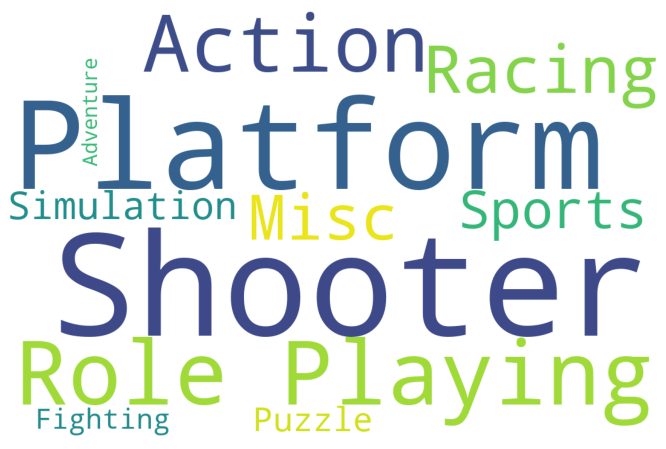

In [104]:
plt.subplots(figsize=(20,8))
wordcloud = WordCloud(background_color='White',width=1080,height=720).generate(" ".join(df.head(100)['Genre']))
plt.imshow(wordcloud)
plt.axis('off')
plt.show()

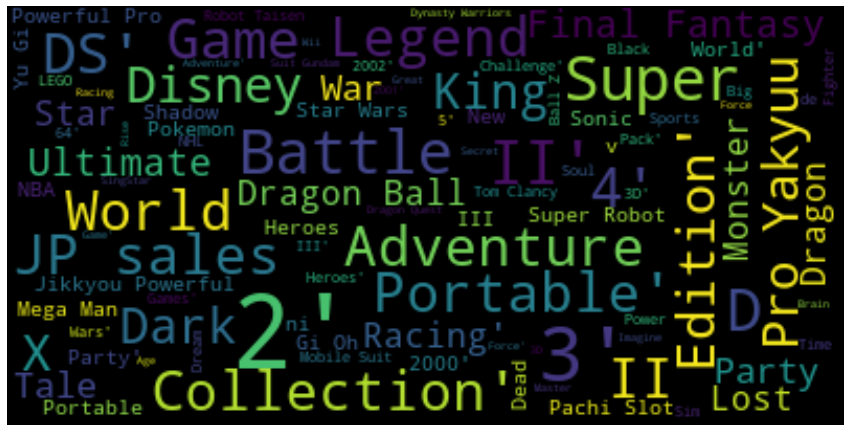

In [54]:
text = list(set(df['Name']))
plt.rcParams['figure.figsize'] = (15,15)
wordcloud = WordCloud(max_font_size=50, max_words=100,background_color="black").generate(str(text))

plt.imshow(wordcloud,interpolation="bilinear")
plt.axis("off")
plt.show()

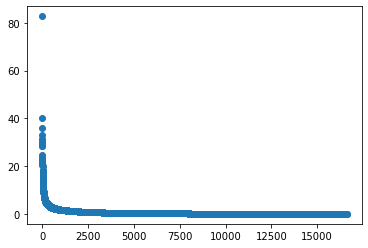

In [98]:
# Linear Regression
 
# response & predictor variables
x = df["Rank"]
y = df["Global_Sales"]


plt.figure()
plt.scatter(x,y)
plt.show()

                            OLS Regression Results                            
Dep. Variable:           Global_Sales   R-squared:                       0.183
Model:                            OLS   Adj. R-squared:                  0.183
Method:                 Least Squares   F-statistic:                     3709.
Date:                Sun, 29 Jan 2023   Prob (F-statistic):               0.00
Time:                        17:47:38   Log-Likelihood:                -29205.
No. Observations:               16598   AIC:                         5.841e+04
Df Residuals:                   16596   BIC:                         5.843e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.6887      0.022     77.369      0.0

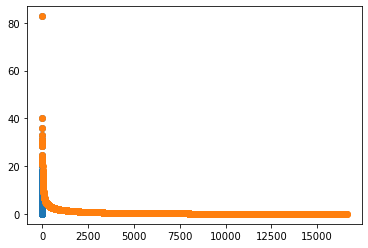

In [13]:
#add constant to predictor variables
x = sm.add_constant(x)
 
#fit linear regression model
model = sm.OLS(y, x).fit()

#view model summary
print(model.summary())

# scatter plot
plt.plot(x, y, 'o')
plt.show()

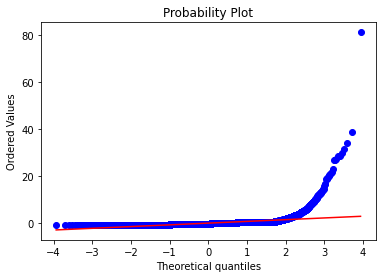

In [100]:
import statsmodels.formula.api as sm
from statsmodels.sandbox.regression.predstd import wls_prediction_std

# 회귀분석 수행
mdl = sm.ols(formula='df["Global_Sales"]~df["Rank"]', data=df)

# 회귀분석 결과에서 잔차만 추출
resid = mdl.fit().resid

from scipy.stats import probplot

# 잔차 분석 

plt.figure()
probplot(resid, plot=plt)
plt.show()

In [101]:
# 잔차 분포 분석 

from scipy import stats

stats.shapiro(resid)

# p-value가 0.05보다 작으므로 귀무가설(잔차가 정규성을 따른다)을 기각, 즉 잔차가 정규성을 만족한다고 볼 수 없다. 

ShapiroResult(statistic=0.27340757846832275, pvalue=0.0)

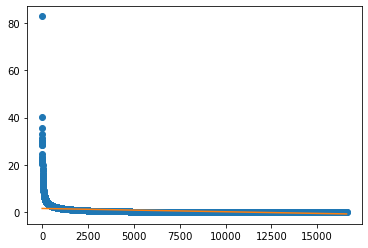

In [64]:
y = df["Global_Sales"]
x = df["Rank"]

plt.plot(x, y, 'o')
plt.plot(x,line_fitter.predict(x.values.reshape(-1,1)))
plt.show()

In [70]:
line_fitter = LinearRegression()
line_fitter.fit(x.values.reshape(-1,1), y)

# 예측
line_fitter.predict([[0.1]])[0]


1.688719131498892

In [69]:
# 기울기 
line_fitter.coef_[0]

-0.00013869980691749652

In [68]:
# 절편 
line_fitter.intercept_

1.6887330014795838

In [ ]:
# 참고자료 

https://www.kaggle.com/code/andreshg/video-games-eda-and-visualization
https://www.kaggle.com/code/ashaabrizvi/videogames-eda-seaborn

https://dining-developer.tistory.com/18